In [1]:
from torchvision.datasets.folder import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
from statistics import mean
import impaintingLib as imp

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def plot_img(x):
    img_grid = make_grid(x[:16])
    plt.figure(figsize=(20,15))
    plt.imshow(img_grid.cpu().permute(1, 2, 0))
    plt.axis('off')
    plt.show()

In [2]:
def test_results_sample(net, testloader, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4):
    with torch.no_grad():
        x, _ = next(iter(testloader))
        x = x.to(device)
        segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
        x_co = random_cutout(x, min_cut, max_cut)
        x_input = torch.cat((x_co, segmented),dim=1)
        outputs = net(x_input)
        plot_img(x[:8])
        plot_img(x_co[:8])
        if simplify_seg:
            plot_img(segmented[:8])
        else:
            classifDisplay = imp.loss.generate_label(segmented,w).to(device)
            plot_img(classifDisplay[:8])
        plot_img(torch.clip(outputs[:8], 0, 1))

In [3]:
classif = imp.loss.getTrainedModel()

def simplifyChannels(x):
    x = np.where(x == 3, 0, x) 
    x = np.where(x == 4, 3, x) 
    x = np.where(x == 5, 3, x) 
    x = np.where(x == 6, 4, x) 
    x = np.where(x == 7, 4, x) 
    x = np.where(x == 8, 5, x) 
    x = np.where(x == 9, 5, x) 
    x = np.where(x == 10 , 6, x) 
    x = np.where(x == 11, 7, x) 
    x = np.where(x == 12, 7, x)  
    x = np.where(x > 12, 0, x) 
    return (x / 9) + 0.1

def npToTensor(x):
    c,w,h = x.shape
    x = torch.from_numpy(x).to(device)
    x = torch.reshape(x, (c,1,w,h))
    return x.float()

def get_segmentation(x, segmenter=classif, scale_factor=4, simplify=True):
    n,c,w,h = x.shape
    with torch.no_grad():
        if scale_factor > 0 :
            x = torch.nn.functional.interpolate(x, scale_factor=scale_factor)
        x = transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))(x)
        y = classif(x)
        if scale_factor > 0 :
            y = torch.nn.functional.avg_pool2d(y, scale_factor)
    if simplify: 
        y = imp.loss.generate_label_plain(y,w)
        y = simplifyChannels(y)
        y = npToTensor(y)
        return y
    else: 
        return y

In [4]:
def test_results_sample(testloader, alter, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4, firsts=True):
    
    if simplify_seg :
        model = imp.model.UNet(4, netType="partial").to(device) 
        model.load_state_dict(torch.load("./modelSave/david/partial4channel_low"))
        model.eval()
    else : 
        model = imp.model.UNet(22, netType="partial").to(device) 
        model.load_state_dict(torch.load("./modelSave/david/partial22channel_low"))
        model.eval()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
    
    with torch.no_grad():
        x, _ = next(iter(testloader))
        x = x.to(device)
        segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
        
        x_prime = alter(x)
        x_input = torch.cat((x_prime, segmented),dim=1)
        
        outputs = model(x_input)
        
        if firsts : 
            plot_img(x[:8])
            plot_img(x_prime[:8])
            
        if simplify_seg:
            plot_img(segmented[:8])
            pass
        else:
            _,_,w,_ = segmented.shape
            classifDisplay = imp.loss.generate_label(segmented,w).to(device)
            plot_img(classifDisplay[:8])
        plot_img(torch.clip(outputs[:8], 0, 1))

## Tests
- Dataset
- Résolution
- Seed 
- Simplify
- Mask

In [5]:
batch_size = 8
factorResize = 1 # 4 2 1 
seed = 0
shuffle = seed == 0
if not shuffle :
    torch.manual_seed(seed)

resize = (120*factorResize, 120*factorResize)
crop   = (64*factorResize, 64*factorResize)

process = transforms.Compose([
     transforms.Resize(resize), 
     transforms.CenterCrop(crop),
     transforms.ToTensor()
])

plot = imp.utils.Visu(gridSize=batch_size).plot_img

if factorResize == 1:
    factorResize = 0

Iteration 1/12


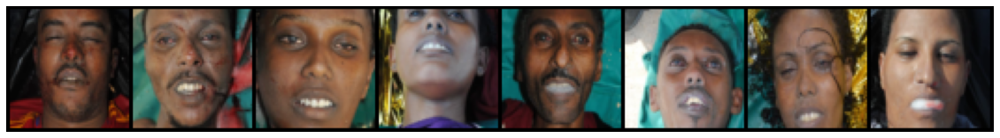

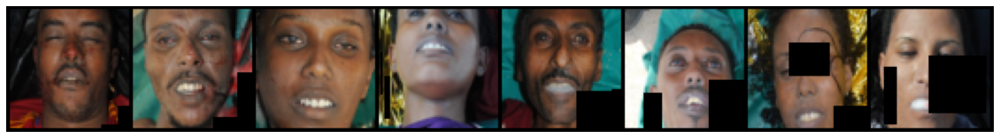

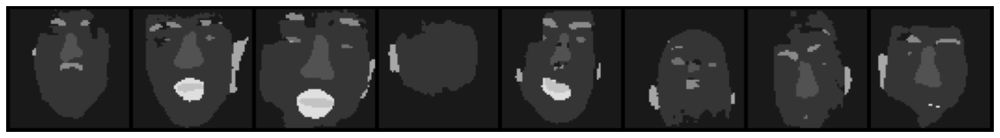

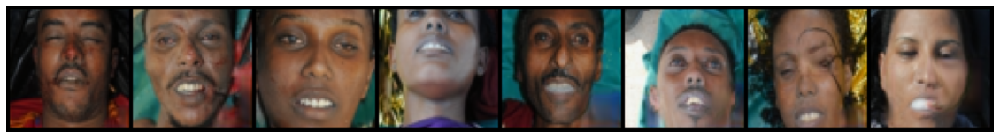

Iteration 2/12


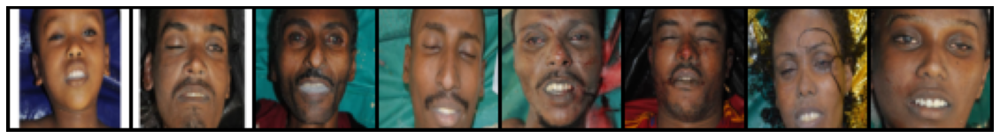

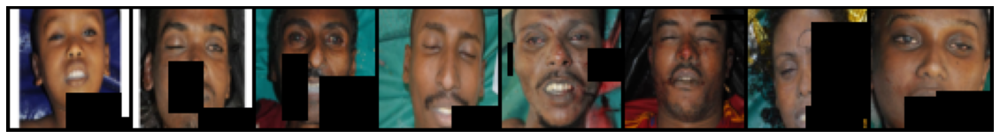

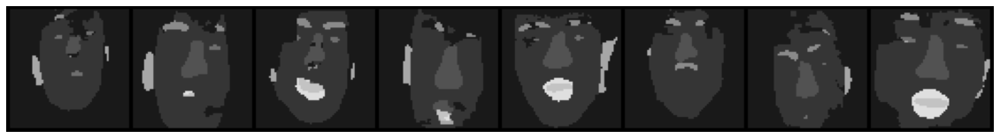

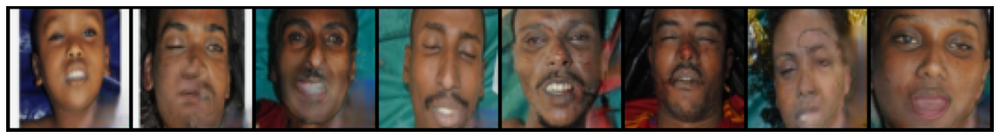

Iteration 3/12


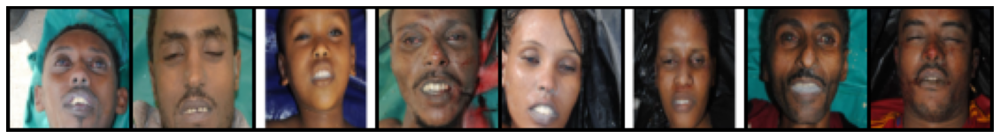

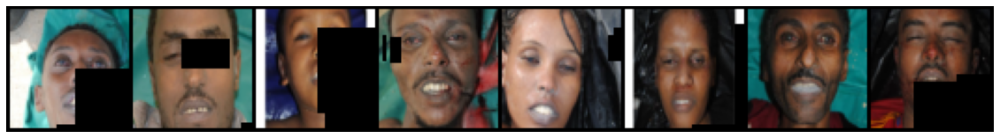

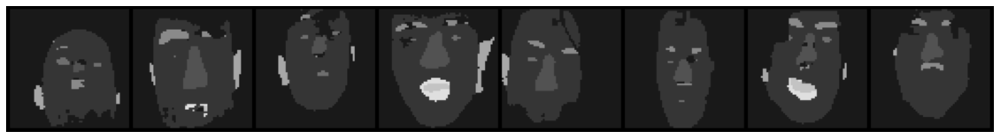

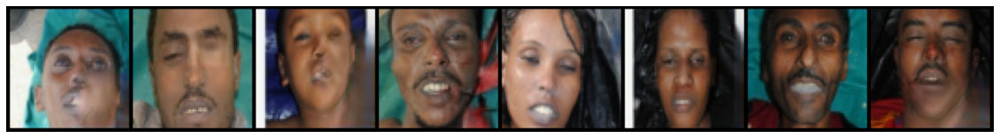

Iteration 4/12


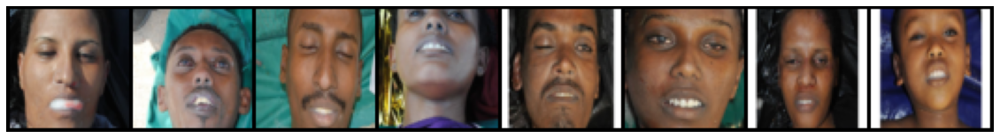

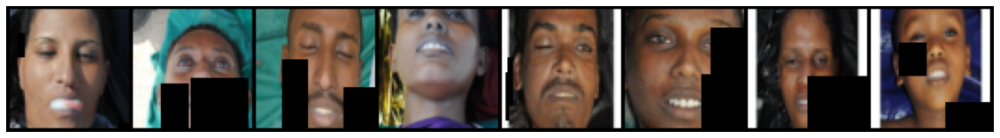

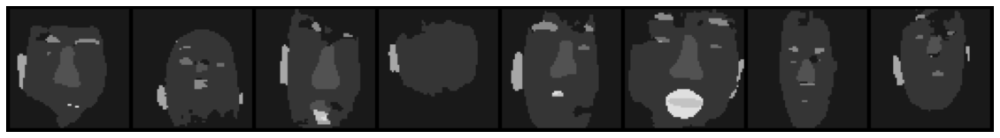

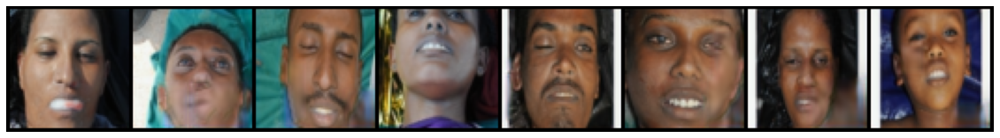

Iteration 5/12


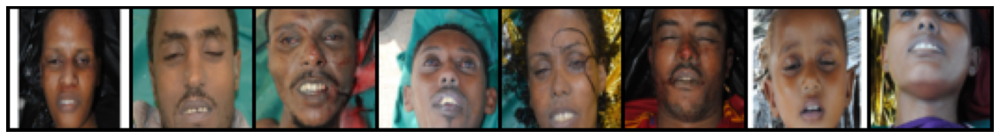

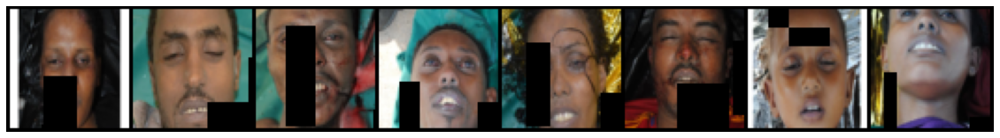

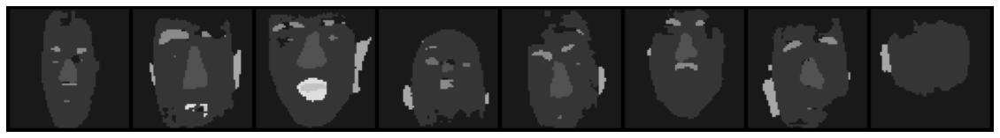

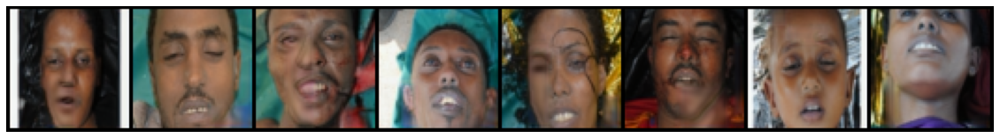

Iteration 6/12


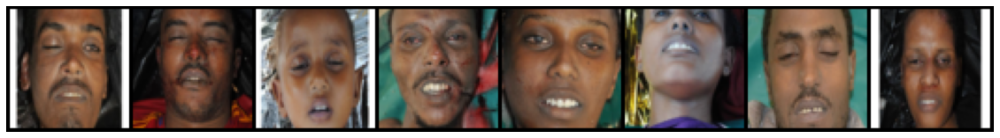

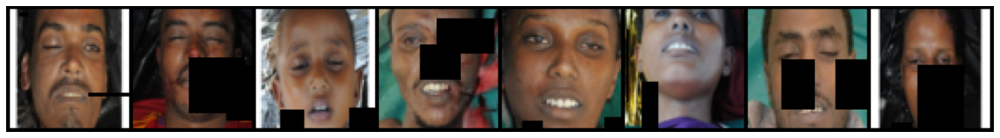

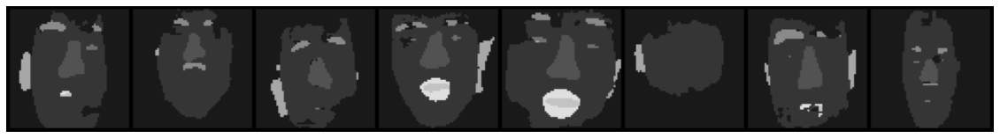

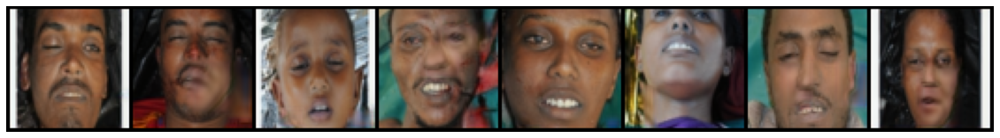

Iteration 7/12


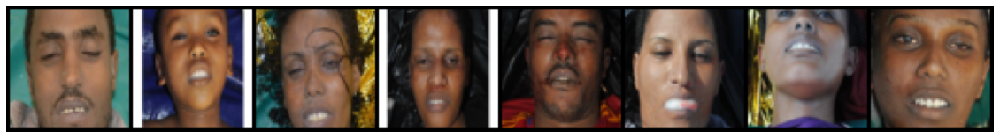

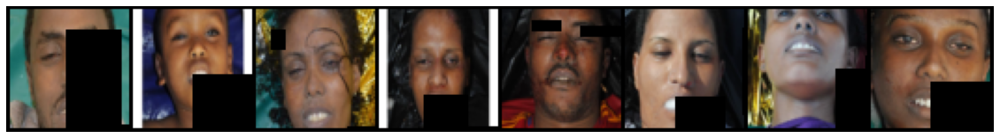

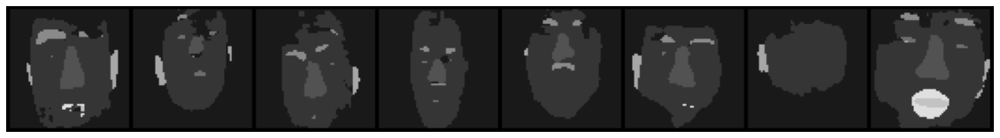

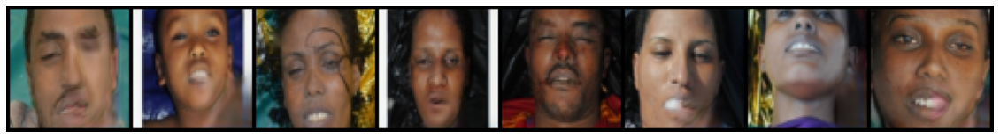

Iteration 8/12


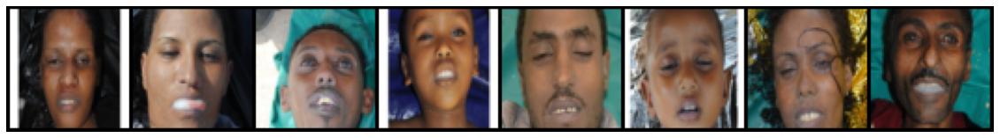

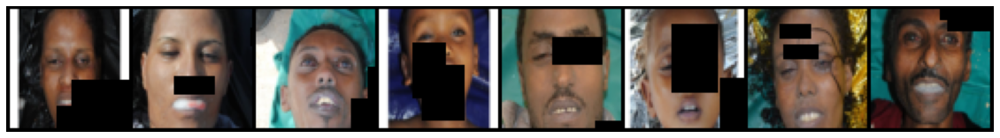

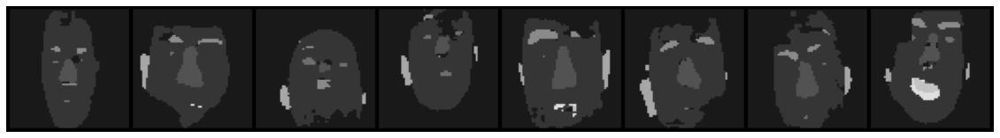

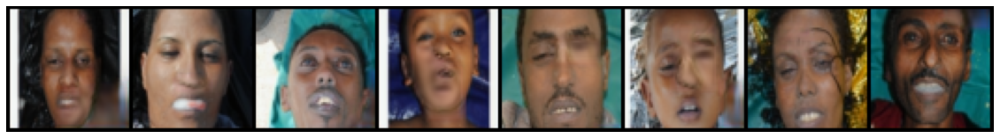

Iteration 9/12


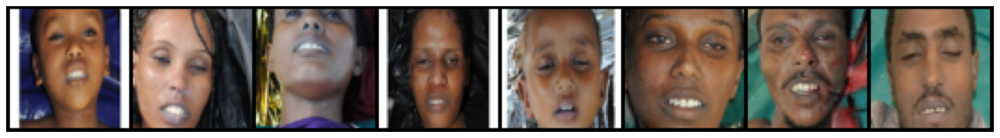

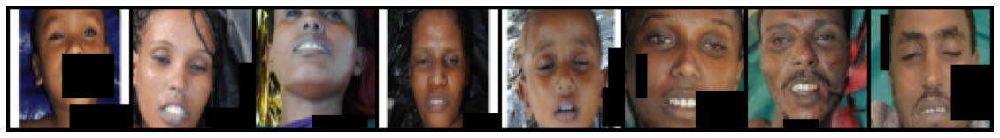

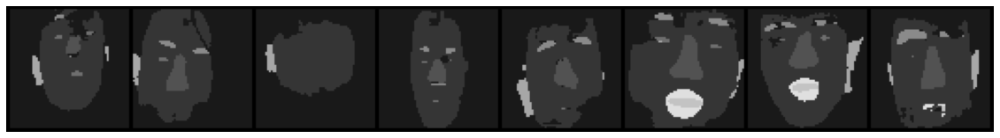

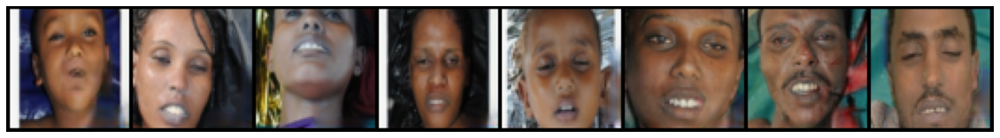

Iteration 10/12


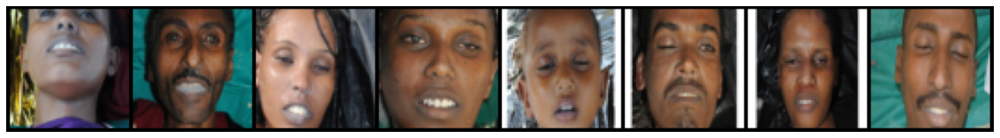

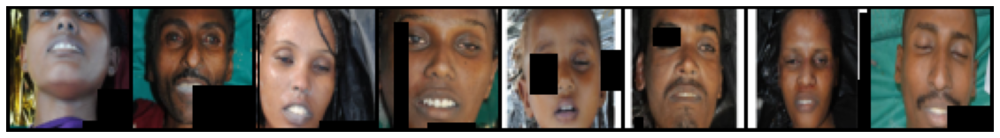

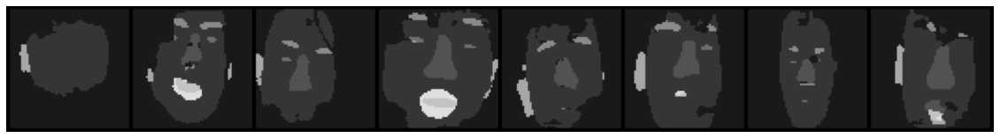

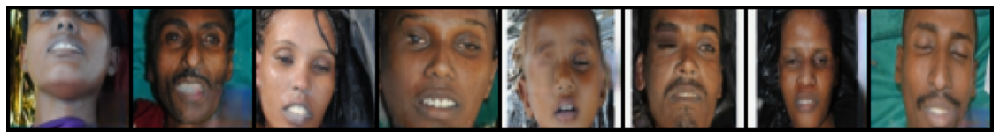

Iteration 11/12


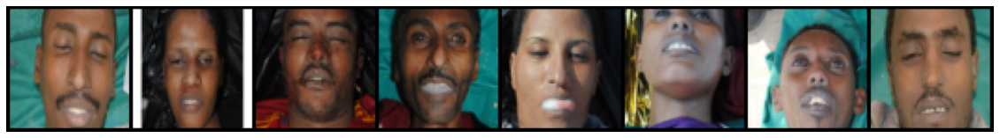

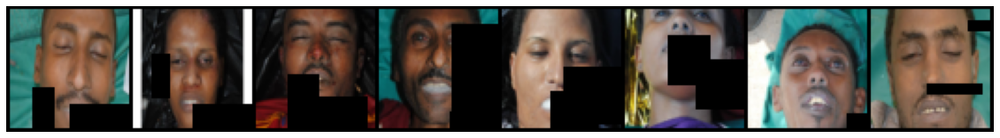

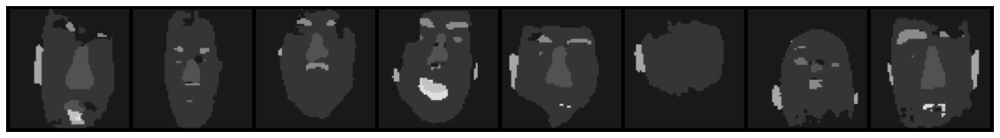

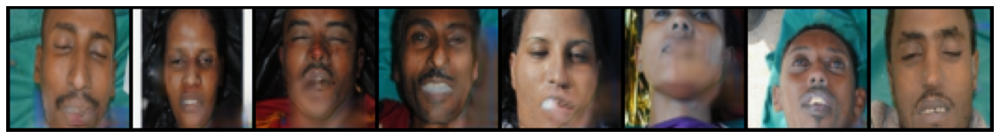

Iteration 12/12


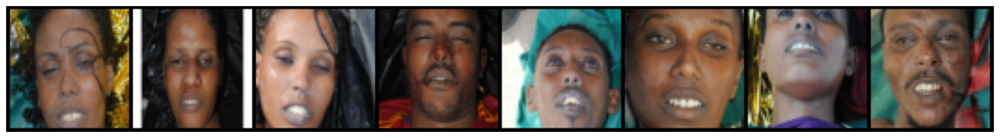

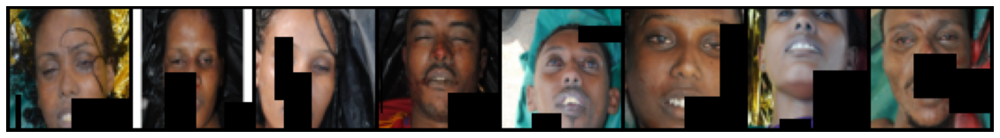

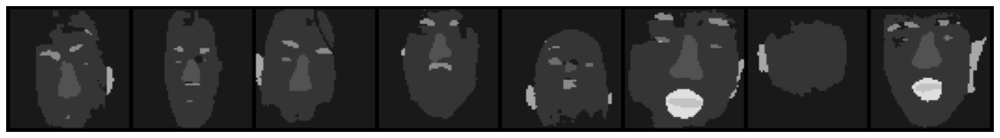

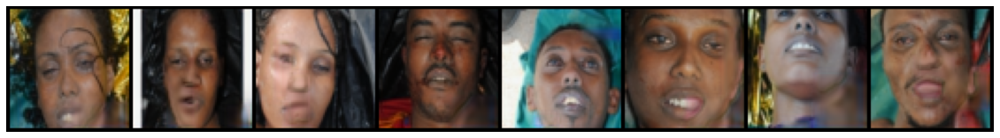

In [95]:
dataset = ImageFolder("./data/real", process) # celeba real
data = DataLoader(dataset, num_workers=0, batch_size=8, shuffle=shuffle)
img,_ = next(iter(data))
steps = 12

# _, data = imp.data.getFaces(shuffle=shuffle,resize=factorResize)

alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).squareMask # squareMask irregularMask
for step in range(steps):
    print("Iteration {}/{}".format(step+1,steps))
    test_results_sample(data, alter, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4-factorResize)
    #test_results_sample(data, alter, simplify_seg=False, min_cut=15,max_cut=45, scale_factor=4-factorResize)
    #test_results_sample(data, alter, simplify_seg=False, min_cut=15,max_cut=45, scale_factor=4-factorResize, firsts = False)